#### Try to get better correlations with looking around a vehicle count measure station and take temperature measuring stations nearest to it instead of dividing basel in squares and looking for stations of both lying in them

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib.animation import FuncAnimation
import matplotlib.patches as ptc
import os
import ast
import datetime as dt
import time
import geopy
from geopy import distance
import geopy.distance

import imageio
from scipy.interpolate import griddata
from scipy.interpolate import interp2d

import math

from functions import vals_to_boxes as boxes
from dateutil.relativedelta import *

In [5]:
temperature = pd.read_csv("datasets/luftklima_reformatted.csv")
vehicles = pd.read_csv("datasets/verkehrszählungen_reformatted.csv")
sdf = pd.read_csv("datasets/strassen.csv", delimiter=";")

In [15]:
box = [7.5554, 7.6240, 47.5342, 47.5815]
x_min = box[0]
x_max = box[1]
y_min = box[2]
y_max = box[3]

In [16]:
spoints = sdf["Geo Shape"]
start = spoints[0].find("[")
spoints = spoints.apply(lambda x: x[start:-1])

In [17]:
basel = plt.imread("maps/basel_square_bw.jpg")

In [18]:
# define function for plotting streets
def plot_streets(zorder=0, rainbow=False, color="red", alpha=1.0):
    label="speed limit ≥ 50km/h"
    for row in spoints:
        # from string to array
        lst = ast.literal_eval(row)
        npa = np.array(lst).T
        x = npa[0, :]
        y = npa[1, :]
        
        if rainbow:
            plt.plot(x, y, zorder=zorder, alpha=alpha, label=label)
            label=None
        else:
            plt.plot(x, y, zorder=zorder, c=color, alpha=alpha, label=label)
            label=None

In [19]:
def plot_stations(df, col_name, color="Blue", size=10, zorder=0, alpha=1, label="Measuring Stations", marker="o"):
    uni = df[col_name].unique()
    x = []
    y = []
    for point in uni:
        x.append(float(point.split(",")[1]))
        y.append(float(point.split(",")[0]))
    plt.scatter(x, y, label=label, c=color, s=size, zorder=zorder, alpha=alpha, marker=marker)

In [20]:
vehicles["Geo Point"].unique()

array(['47.5751385212,7.56315796773', '47.5707346457,7.58226721123',
       '47.5739067576,7.60221558365', '47.5747982039,7.56235975514',
       '47.544580317,7.58621009181', '47.5427356062,7.58499570186',
       '47.5952640302,7.65559694893', '47.5381329483,7.59973013355',
       '47.5451875415,7.6017439017', '47.5768609024,7.56734174237',
       '47.5454597631,7.59957932935', '47.5487720165,7.60074551669',
       '47.5665568071,7.59767325247', '47.5463002054,7.5956105688',
       '47.5741246781,7.57471395015', '47.5680940673,7.57380422434',
       '47.5676129884,7.57101717908', '47.5527116018,7.60459281521',
       '47.5582014188,7.59753472493', '47.5811860062,7.60450160902',
       '47.5699125893,7.57284015165', '47.5771259757,7.59655916981',
       '47.5656137668,7.58805266441', '47.5520832984,7.58677034361',
       '47.5889260115,7.5931162086', '47.5499027851,7.58292410405',
       '47.5441806077,7.57712039374', '47.5621767136,7.56405911184',
       '47.5722888439,7.6239861801', '

In [21]:
vec_stats = vehicles["Geo Point"].unique()
temp_stats = temperature["Koordinaten"].unique()

In [22]:
len(vec_stats), len(temp_stats)

(32, 181)

In [23]:
pd.set_option('display.max_columns', None)

In [24]:
vehicles.head()

,Unnamed: 0,SiteName,DateTimeFrom,DateTimeTo,Total,MR,PW,PW+,Lief,Lief+,Lief+Aufl.,LW,LW+,Sattelzug,Bus,andere,Year,Date,TimeFrom,TimeTo,Geo Point,Latitude,Longitude
0,0,"235 A3-A35, Grenze CH-F",2019-01-01 00:00:00+01:00,2019-01-01 01:00:00+01:00,87,1,83,0,3,0,0,0,0,0,0,0,2019,01.01.2019,00:00,01:00,"47.5751385212,7.56315796773",47.575139,7.563158
1,1,350 Dreirosenbrücke lokal,2019-01-01 00:00:00+01:00,2019-01-01 01:00:00+01:00,193,0,182,0,10,0,0,1,0,0,0,0,2019,01.01.2019,00:00,01:00,"47.5707346457,7.58226721123",47.570735,7.582267
2,2,411 Fasanenstrasse,2019-01-01 00:00:00+01:00,2019-01-01 01:00:00+01:00,19,0,19,0,0,0,0,0,0,0,0,0,2019,01.01.2019,00:00,01:00,"47.5739067576,7.60221558365",47.573907,7.602216
3,3,660 Flughafenstrasse,2019-01-01 00:00:00+01:00,2019-01-01 01:00:00+01:00,4,0,4,0,0,0,0,0,0,0,0,0,2019,01.01.2019,00:00,01:00,"47.5747982039,7.56235975514",47.574798,7.562360
4,4,411 Fasanenstrasse,2019-01-01 00:00:00+01:00,2019-01-01 01:00:00+01:00,13,1,8,0,3,0,0,1,0,0,0,0,2019,01.01.2019,00:00,01:00,"47.5739067576,7.60221558365",47.573907,7.602216


In [107]:
def get_temp_for_vstation(temperature, vehicles, radius, time_from, time_to, hour_from, hour_to, time_step = 1, half_day=False):
    startTime = time.time()
    
    date_and_hour_start = dt.datetime.strptime(time_from + " " + hour_from, "%Y-%m-%d %H")
    date_and_hour_start2 = dt.datetime.strptime(time_from + " 9", "%Y-%m-%d %H")
    date_and_hour_end = dt.datetime.strptime(time_to + " " + hour_to, "%Y-%m-%d %H")
    time_from = dt.datetime.strptime(time_from, "%Y-%m-%d")
    time_to = dt.datetime.strptime(time_to, "%Y-%m-%d")
    print(time_to)
    print(date_and_hour_start)
    print(time_to>date_and_hour_start)
    delta_days = (time_to - time_from).days
    
    vehicles["hour"] = pd.to_datetime(vehicles["TimeFrom"], format="%H:%M").dt.strftime("%H").astype(int)
    vehicles["Datum"] = pd.to_datetime(vehicles["Date"], format="%d.%m.%Y")#.dt.strftime("%Y-%m-%d")
    temperature["Datum"] = pd.to_datetime(temperature["Datum"], format="%Y-%m-%d")#.dt.strftime("%Y-%m-%d")
    temp = temperature[(temperature.Datum >= time_from) & (temperature.Datum <= time_to)]
    temp_here = temperature[(temperature.Datum >= time_from) & (temperature.Datum <= time_to)]
    veh = vehicles[(vehicles.Datum >= time_from) & (vehicles.Datum <= time_to)]
    veh_here = vehicles[(vehicles.Datum >= time_from) & (vehicles.Datum <= time_to)]
        
    veh_stats = veh["Geo Point"].unique()
    temp_stats = temp["Koordinaten"].unique()
    vx = []
    vy = []
    tx = []
    ty = []
    for point in veh_stats:
        vx.append(float(point.split(",")[1]))
        vy.append(float(point.split(",")[0]))
        
    for point in temp_stats:
        tx.append(float(point.split(",")[1]))
        ty.append(float(point.split(",")[0]))
        
    vn = len(veh_stats)
    tn = len(temp_stats)
    print(vn)
    print(tn)
    
    stats = [] # includes a set of nearby temp. measure stations for every vehicle count station
    
    for i in range(vn):
        stats_v = []
        for j in range(tn):
            if haversine(vx[i], vy[i], tx[j], ty[j]) < radius:
            #if math.sqrt((vx[i] - tx[j])**2 + (vy[i] - ty[j])**2) < radius:
                stats_v.append((tx[j], ty[j]))
        stats.append(stats_v)
        
    #print(stats)
    temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
    veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
    
    
    if half_day: # only take measurements, that were made between 09:00 and 18:00
        corr = []
        v = 0
        for s in stats:
            date_start = date_and_hour_start2
            corr_v = []
            corr_t = []
            while(True):
            #for i in range(delta_days):
                date = date_start.strftime("%Y-%m-%d")
                hour = int(date_start.strftime("%H"))

                hourly_stats_temp = temp_here[(temp_here.Datum == date) & (temp_here.Stunde == hour)]
                hourly_stats_veh = veh_here[(veh_here.Datum == date) & (veh_here.hour == hour)]
                #print(temp_here["Datum"].unique())
                temp = 0
                for stat in s:
                    #print(stat[0])
                    p = str(stat[1]) + "," + str(stat[0])
                    station = hourly_stats_temp[hourly_stats_temp["Koordinaten"] == p]
                    #print(station)
                    t = station["Lufttemperatur"].tolist()
                    #print(t.head())
                    if len(t) != 0:
                        #print(len(t))
                        temp += t[0]
                        #print("temps: ")
                        #print(t)
                    else:
                        date_start += dt.timedelta(hours=1)
                
                        if int(date_start.strftime("%H")) > 18:
                            date_start += dt.timedelta(hours=14)

                        if date_start > date_and_hour_end:
                            #print("DONE: " + str(v), flush=True)
                            break
                        #print(date_start)
                        continue

                if len(s) > 0:
                    temp /= len(s)
                #print(temp, flush=True)

                p = str(vy[v]) + "," + str(vx[v])
                vc = hourly_stats_veh[hourly_stats_veh["Geo Point"] == p]
                vcs = vc["Total"].tolist()
                #print("vecs: ")
                #print(vcs)
                #print(len(vcs))
                if len(vcs) != 0:
                    v_num = 0
                    v_count = 0
                    for k in range(len(vcs)):
                        v_count += vcs[k]
                        v_num += 1
                    v_count /= v_num
                else:
                    date_start += dt.timedelta(hours=1)
                
                    if int(date_start.strftime("%H")) > 18:
                        date_start += dt.timedelta(hours=14)

                    if date_start > date_and_hour_end:
                        #print("DONE: " + str(v), flush=True)
                        break
                    #print(date_start)
                    continue
                    #v_count = 0
                #print(v_count)
                #print("HERE1")

                corr_v.append(v_count)
                corr_t.append(temp)
                ##print(date_start, flush=True)
                
                date_start += dt.timedelta(hours=1)
                
                if int(date_start.strftime("%H")) > 18:
                    date_start += dt.timedelta(hours=14)
                    
                if date_start > date_and_hour_end:
                    #print("DONE: " + str(v), flush=True)
                    break
                #print(date_start)

            corr_v = np.array(corr_v)        
            corr_t = np.array(corr_t)      
            c = np.corrcoef(np.vstack([corr_v, corr_t]))
            corr.append(c[0][1])

            v += 1  
            print("DONE: " + str(v), flush=True)
            
    else:
        corr = []
        v = 0
        for s in stats:
            date_start = date_and_hour_start
            corr_v = []
            corr_t = []
            while(True):
            #for i in range(delta_days):
                date = date_start.strftime("%Y-%m-%d")
                hour = int(date_start.strftime("%H"))

                hourly_stats_temp = temp_here[(temp_here.Datum == date) & (temp_here.Stunde == hour)]
                hourly_stats_veh = veh_here[(veh_here.Datum == date) & (veh_here.hour == hour)]
                #print(temp_here["Datum"].unique())
                temp = 0
                for stat in s:
                    #print(stat[0])
                    p = str(stat[1]) + "," + str(stat[0])
                    station = hourly_stats_temp[hourly_stats_temp["Koordinaten"] == p]
                    #print(station)
                    t = station["Lufttemperatur"].tolist()
                    #print(t.head())
                    if len(t) != 0:
                        #print(len(t))
                        temp += t[0]
                    else:
                        date_start += dt.timedelta(hours=time_step)
                        if date_start > date_and_hour_end:
                            #print("DONE: " + str(v), flush=True)
                            break
                        continue

                if len(s) > 0:
                    temp /= len(s)
                #print(temp, flush=True)

                p = str(vy[v]) + "," + str(vx[v])
                vc = hourly_stats_veh[hourly_stats_veh["Geo Point"] == p]
                vcs = vc["Total"].tolist()
                #print(vcs)
                if len(vcs) != 0:
                    v_num = 0
                    v_count = 0
                    for k in range(len(vcs)):
                        v_count += vcs[k]
                        v_num += 1
                    v_count /= v_num
                else:
                    date_start += dt.timedelta(hours=time_step)
                    if date_start > date_and_hour_end:
                        #print("DONE: " + str(v), flush=True)
                        break
                    continue
                    #v_count = 0
                #print(v_count)
                #print("HERE1")

                corr_v.append(v_count)
                corr_t.append(temp)
                
                #print("Temp: " + str(temp) + " : " + str(v))
                #print("v_count: " + str(v_count) + " : " + str(v))
                ##print(date_start, flush=True)
                
                date_start += dt.timedelta(hours=time_step)
                if date_start > date_and_hour_end:
                    #print("DONE: " + str(v), flush=True)
                    break

            corr_v = np.array(corr_v)        
            corr_t = np.array(corr_t)      
            c = np.corrcoef(np.vstack([corr_v, corr_t]))
            corr.append(c[0][1])

            v += 1  
            print("DONE: " + str(v), flush=True)

    print(corr)
    print("TIME NEEDED: ", time.time() - startTime)
    return(vx, vy, corr)

In [108]:
def calc_ellipse_dists(x, y, dist):
    w = []
    h = []

    for i in range(len(x)):
        long2 = geopy.distance.distance(kilometers=dist).destination((y[i], x[i]), bearing=90)
        long2 = long2[1]
        lat2 = geopy.distance.distance(kilometers=dist).destination((y[i], x[i]), bearing=0)
        lat2 = lat2[0]
        
        width = 2 * (x[i] - long2)
        height = 2 * (y[i] - lat2)
        
        w.append(width)
        h.append(height)
        
    return(w, h) # width and height of ellipses

In [52]:
corr = get_temp_for_vstation("2020-06-01", "2020-06-03", "9",  0.4, 2, True)
el = calc_ellipse_dists(corr[0], corr[1], 0.4)

2020-06-03 00:00:00
2020-06-01 09:00:00
True
29
104
2020-06-01 09:00:00
2020-06-01 10:00:00
2020-06-01 11:00:00
2020-06-01 12:00:00
2020-06-01 13:00:00
2020-06-01 14:00:00
2020-06-01 15:00:00
2020-06-01 16:00:00
2020-06-01 17:00:00
2020-06-01 18:00:00
2020-06-02 09:00:00
2020-06-02 10:00:00
2020-06-02 11:00:00
2020-06-02 12:00:00
2020-06-02 13:00:00
2020-06-02 14:00:00
2020-06-02 15:00:00
2020-06-02 16:00:00
2020-06-02 17:00:00
2020-06-02 18:00:00
DONE: 1
2020-06-01 09:00:00
2020-06-01 10:00:00
2020-06-01 11:00:00
2020-06-01 12:00:00
2020-06-01 13:00:00
2020-06-01 14:00:00
2020-06-01 15:00:00
2020-06-01 16:00:00
2020-06-01 17:00:00
2020-06-01 18:00:00
2020-06-02 09:00:00
2020-06-02 10:00:00
2020-06-02 11:00:00


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/2684718005.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/2684718005.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


2020-06-02 12:00:00
2020-06-02 13:00:00
2020-06-02 14:00:00
2020-06-02 15:00:00
2020-06-02 16:00:00
2020-06-02 17:00:00
2020-06-02 18:00:00
DONE: 2
2020-06-01 09:00:00
2020-06-01 10:00:00
2020-06-01 11:00:00
2020-06-01 12:00:00
2020-06-01 13:00:00
2020-06-01 14:00:00
2020-06-01 15:00:00
2020-06-01 16:00:00
2020-06-01 17:00:00
2020-06-01 18:00:00
2020-06-02 09:00:00
2020-06-02 10:00:00
2020-06-02 11:00:00
2020-06-02 12:00:00
2020-06-02 13:00:00
2020-06-02 14:00:00
2020-06-02 15:00:00
2020-06-02 16:00:00
2020-06-02 17:00:00
2020-06-02 18:00:00
DONE: 3
2020-06-01 09:00:00
2020-06-01 10:00:00
2020-06-01 11:00:00
2020-06-01 12:00:00
2020-06-01 13:00:00
2020-06-01 14:00:00
2020-06-01 15:00:00
2020-06-01 16:00:00
2020-06-01 17:00:00
2020-06-01 18:00:00
2020-06-02 09:00:00
2020-06-02 10:00:00
2020-06-02 11:00:00
2020-06-02 12:00:00
2020-06-02 13:00:00
2020-06-02 14:00:00
2020-06-02 15:00:00
2020-06-02 16:00:00
2020-06-02 17:00:00
2020-06-02 18:00:00
DONE: 4
2020-06-01 09:00:00
2020-06-01 10:00

C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


2020-06-02 11:00:00
2020-06-02 12:00:00
2020-06-02 13:00:00
2020-06-02 14:00:00
2020-06-02 15:00:00
2020-06-02 16:00:00
2020-06-02 17:00:00
2020-06-02 18:00:00
DONE: 10
2020-06-01 09:00:00
2020-06-01 10:00:00
2020-06-01 11:00:00
2020-06-01 12:00:00
2020-06-01 13:00:00
2020-06-01 14:00:00
2020-06-01 15:00:00
2020-06-01 16:00:00
2020-06-01 17:00:00
2020-06-01 18:00:00
2020-06-02 09:00:00
2020-06-02 10:00:00
2020-06-02 11:00:00
2020-06-02 12:00:00
2020-06-02 13:00:00
2020-06-02 14:00:00
2020-06-02 15:00:00
2020-06-02 16:00:00
2020-06-02 17:00:00
2020-06-02 18:00:00
DONE: 11
2020-06-01 09:00:00
2020-06-01 10:00:00
2020-06-01 11:00:00
2020-06-01 12:00:00
2020-06-01 13:00:00
2020-06-01 14:00:00
2020-06-01 15:00:00
2020-06-01 16:00:00
2020-06-01 17:00:00
2020-06-01 18:00:00
2020-06-02 09:00:00
2020-06-02 10:00:00
2020-06-02 11:00:00
2020-06-02 12:00:00
2020-06-02 13:00:00
2020-06-02 14:00:00
2020-06-02 15:00:00
2020-06-02 16:00:00
2020-06-02 17:00:00
2020-06-02 18:00:00
DONE: 12
2020-06-01 09

In [111]:
def plot_corr(corr, el, nr, date_start, date_end):
    fig, ax = plt.subplots(figsize=(7, 7), dpi=160)
    #plt.figure(figsize=(7, 7), dpi=160)

    cmap = matplotlib.cm.get_cmap('Greens', 10)
    norm = matplotlib.colors.Normalize(vmin=0.0, vmax=1.0)
    ellipses = []
    for i in range(len(corr[2])):
        if corr[2][i] > -999999999999: #get rid of NaN
            ell = Ellipse((corr[0][i], corr[1][i]), el[0][i], el[1][i], 0, color=cmap(norm(corr[2][i])), fill = True, alpha=.7)
            #cir = plt.Circle((corr[0][i], corr[1][i]), 0.004, color=cmap(norm(corr[2][i])), fill = True, alpha=.7)
            ellipses.append(ell)
    for e in ellipses:
         ax.add_artist(e)

    plot_streets(zorder=1, color="indigo")        
    plot_stations(vehicles, "Geo Point", zorder=3, size=25, color="firebrick", alpha=.9, label="Vehicle counting Station", marker=",")
    plot_stations(temperature, "Koordinaten", zorder=3, size=25, color="darkgoldenrod", alpha=.9, label="Temperature measuring station", marker="^")
    #plt.scatter(corr[0], corr[1], marker="o", zorder=1, c=corr[2], s=600)
    plt.imshow(basel, extent=box, zorder=0, aspect=1.4, alpha=.7, cmap = matplotlib.cm.get_cmap('Greens', 10))
    plt.colorbar(label="correlation", fraction=0.046, pad=0.04)
    plt.clim((0, 1))
    plt.title("Correlation between Temperature and counted Vehicles, from " + date_start + " to " + date_end + ", pad=20")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.legend(loc='lower right')
    plt.show()

    img_name = "test_images/corr_try_" + str(nr) + ".png" 
    fig.savefig(img_name)
    plt.close()

2020-08-31 00:00:00
2020-08-01 01:00:00
True
29
127


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[0.11558792333884134, 0.18927739176249436, 0.03188814700128181, -0.028134239871673045, 0.06895971716318217, -0.12747086828491394, -0.1806414898892309, nan, nan, -0.03798366343394629, 0.01618421371192684, 0.2039948184530733, 0.09895521761788847, 0.13860715049644062, 0.1851392568644789, 0.11510010192890292, 0.2668903167853074, -0.007756751954902159, nan, nan, 0.10818968239955426, 0.04297305772174541, 0.17661612117165096, 0.08615719944437049, 0.0630095133084459, -0.027885371904076646, -0.08051271950420288, nan, 0.12369035466893624]
TIME NEEDED:  102.5907666683197
1 correlations calculated, now plotting...


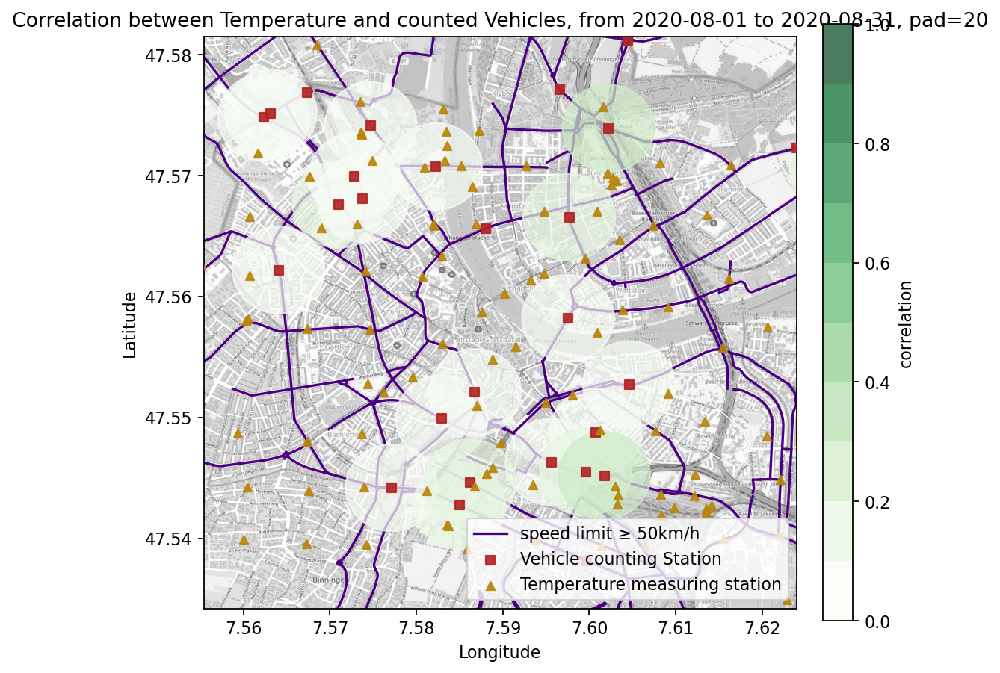

2020-09-30 00:00:00
2020-09-01 01:00:00
True
30
133


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
DONE: 30
[0.03276787614246521, 0.2344895112845019, 0.048559730014004925, 0.35661644918944824, -0.18824544907416052, 0.24617484627095101, 0.11345315520972234, 0.17739277470893672, 0.4402286323282296, 0.08690764882263421, 0.06032360247800275, 0.23031736213210807, nan, 0.08437190615855049, 0.2637548090441077, 0.30742207205407557, 0.22714495938557724, 0.10074084775286314, nan, 0.3425464661053646, 0.2077613613240583, 0.287270786924728, 0.0004524782827116322, nan, nan, 0.33818223700024813, 0.20680849799921006, 0.20456988767772954, nan, 0.0797676059232119]
TIME NEEDED:  104.45010733604431
2 correlations calculated, now plotting...


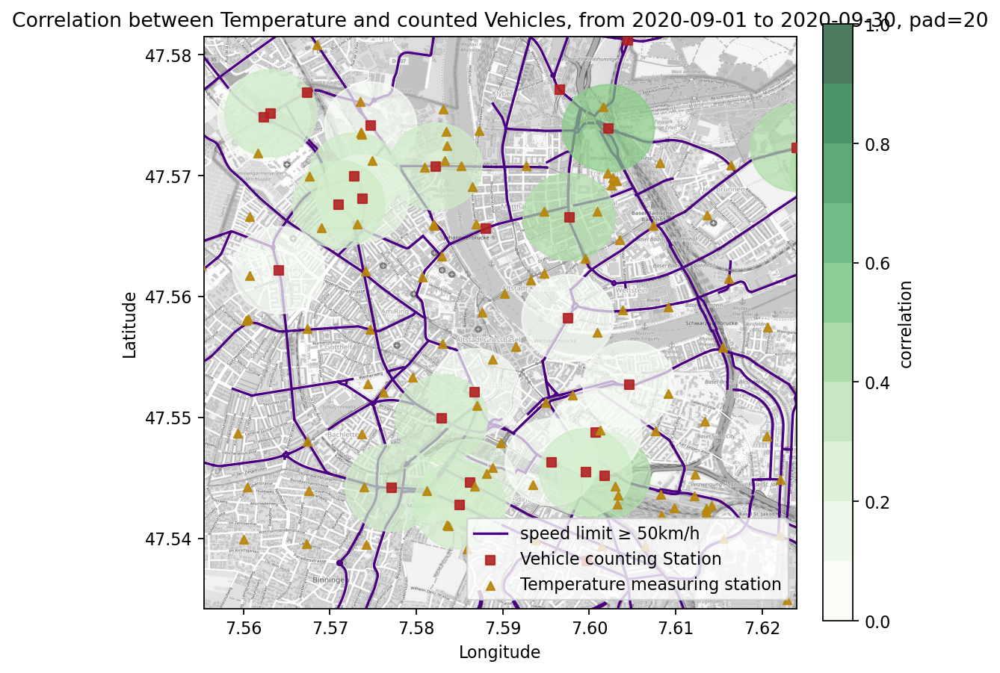

2020-10-31 00:00:00
2020-10-01 01:00:00
True
29
139


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[0.21186878607315943, 0.11630836948493481, 0.23880143681930713, 0.0693710337255169, 0.23549934965489838, 0.09792064164291603, 0.12897788485553377, nan, nan, 0.10933753911022907, 0.07937152144277393, 0.3296330323797708, 0.18062618897216276, 0.17263196718762278, 0.16199453013053086, nan, nan, 0.1723558261441737, 0.0810047468151302, 0.19602654775941317, 0.14927992804850457, 0.22262675887629976, nan, 0.16137897028173145, 0.12476460417230324, 0.047009476467270814, 0.13584350057086342, 0.08479100351631705, 0.1787629230847744]
TIME NEEDED:  107.17810297012329
3 correlations calculated, now plotting...


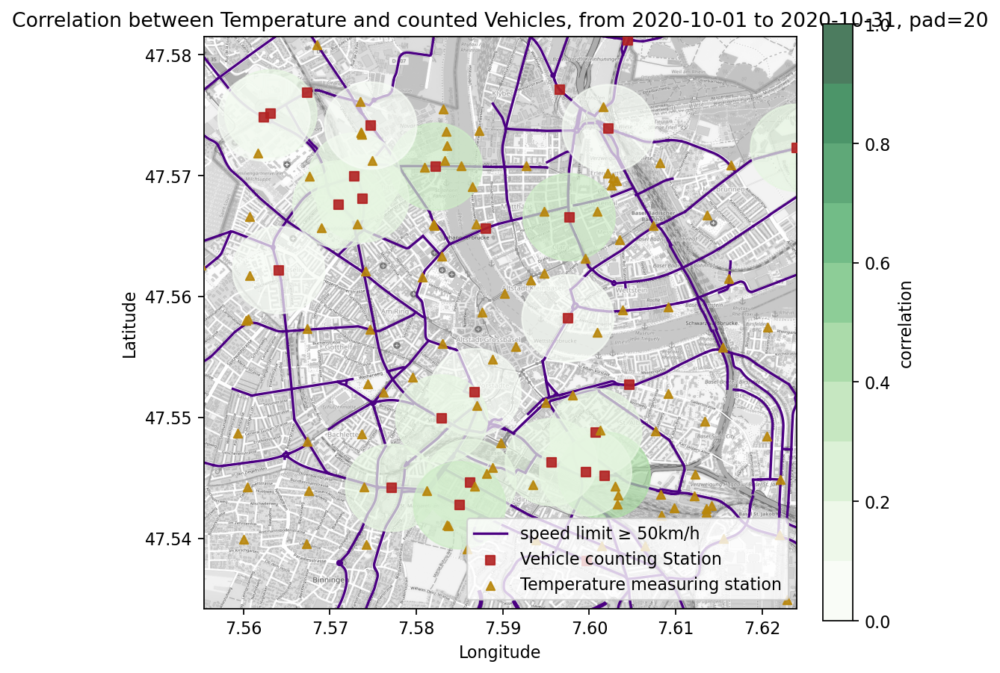

2020-11-30 00:00:00
2020-11-01 01:00:00
True
29
149


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[nan, nan, 0.251776624484718, 0.12528301282077664, 0.2747829785591164, 0.24291660856922004, 0.2519583254653551, 0.22577063952089044, 0.18383281521491188, -0.00017177405423953265, nan, 0.1815767592516257, 0.29619070898373384, nan, 0.2045389854954556, 0.29166159908257316, 0.18370441236809282, nan, 0.274980149136011, -0.021338941054839054, 0.12622868113176403, 0.1275729271754194, 0.11743712131163168, 0.2536249466607326, 0.05075902652190126, 0.19889606424743034, 0.12336790691594031, 0.24526059877554296, -0.016645084251366866]
TIME NEEDED:  99.78586745262146
4 correlations calculated, now plotting...


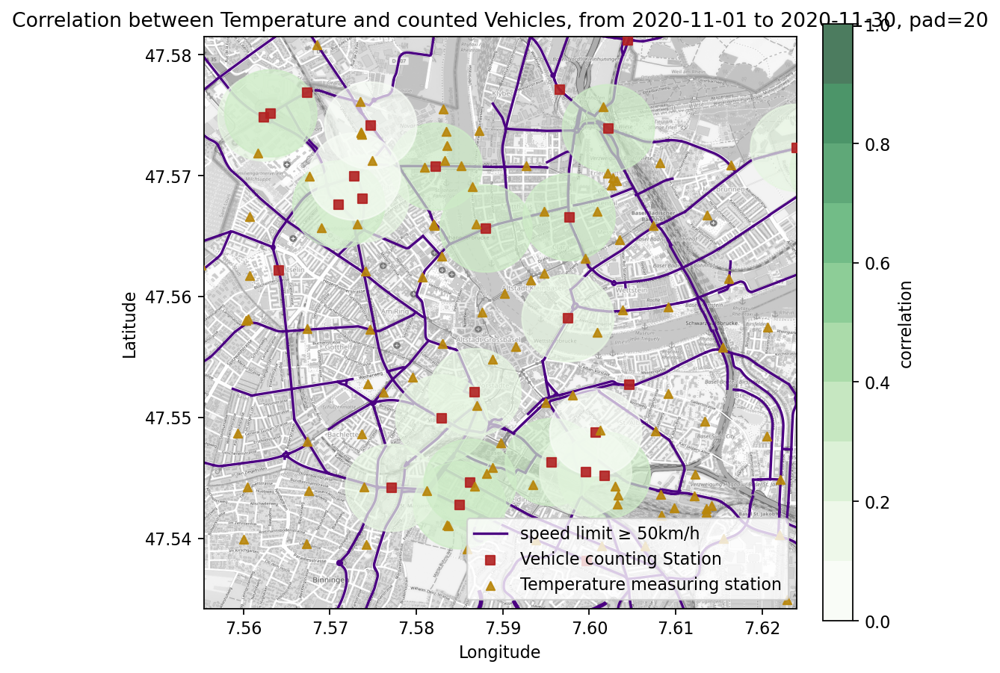

2020-12-31 00:00:00
2020-12-01 01:00:00
True
29
139


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[0.35499674632688694, 0.3302057249283136, nan, 0.3161579166617677, 0.2960586055176746, 0.21372658223191213, 0.2840844726623772, 0.28615421701437527, 0.3043871640106147, nan, 0.32443174418393383, nan, -0.04706764532451072, 0.25414532973785753, 0.3632132160042644, 0.37929942756646345, 0.32152651257774395, 0.3954022286867801, 0.363393402138275, nan, 0.3258010159980521, 0.30321857110295075, 0.4156909802077113, 0.22815927149033827, 0.2965724965865876, 0.33385119619714654, 0.3894740470563847, nan, 0.35905779419429223]
TIME NEEDED:  102.40880107879639
5 correlations calculated, now plotting...


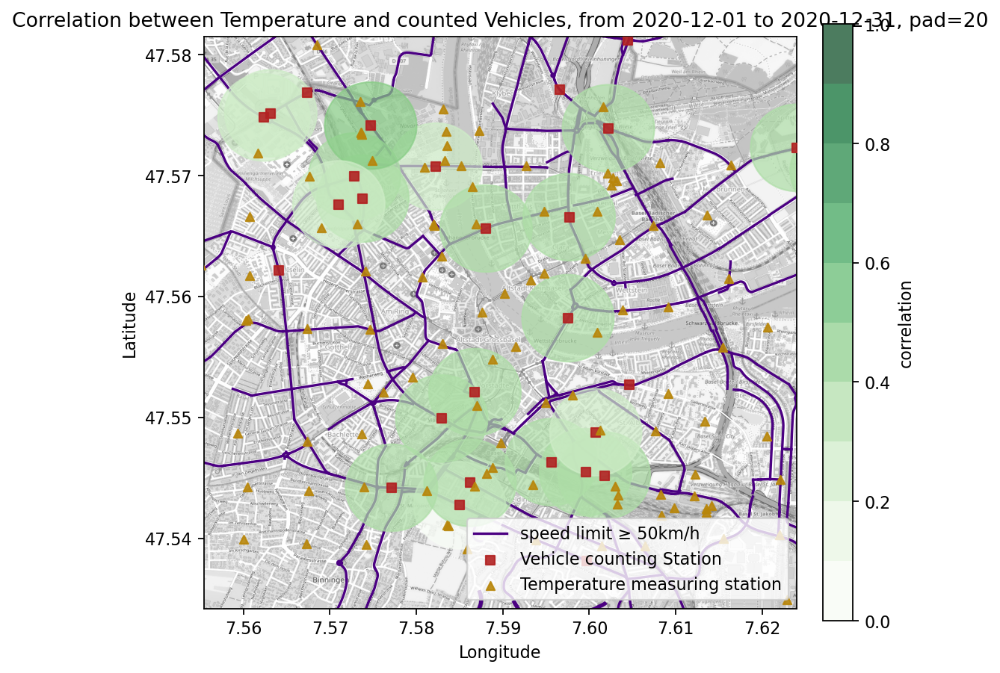

2021-01-31 00:00:00
2021-01-01 01:00:00
True
30
141


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
DONE: 30
[0.26765639114511564, 0.377391855078701, 0.3179849917738302, 0.28968253716915887, 0.2706310486503243, 0.1293438037142517, -0.2453801218699272, 0.2223733597821379, nan, 0.2281380883709062, 0.2935170724385964, 0.33412956526837895, nan, nan, nan, 0.1822795306218618, 0.2843559770293071, nan, 0.14189120287335263, -0.013090431948810153, 0.21549243089553827, 0.2749073057347954, 0.25352469340196654, 0.24568961986240934, 0.3397444130547526, 0.2489155294478217, 0.3234343832799137, 0.32481038618348423, 0.259168850409925, nan]
TIME NEEDED:  100.08746790885925
6 correlations calculated, now plotting...


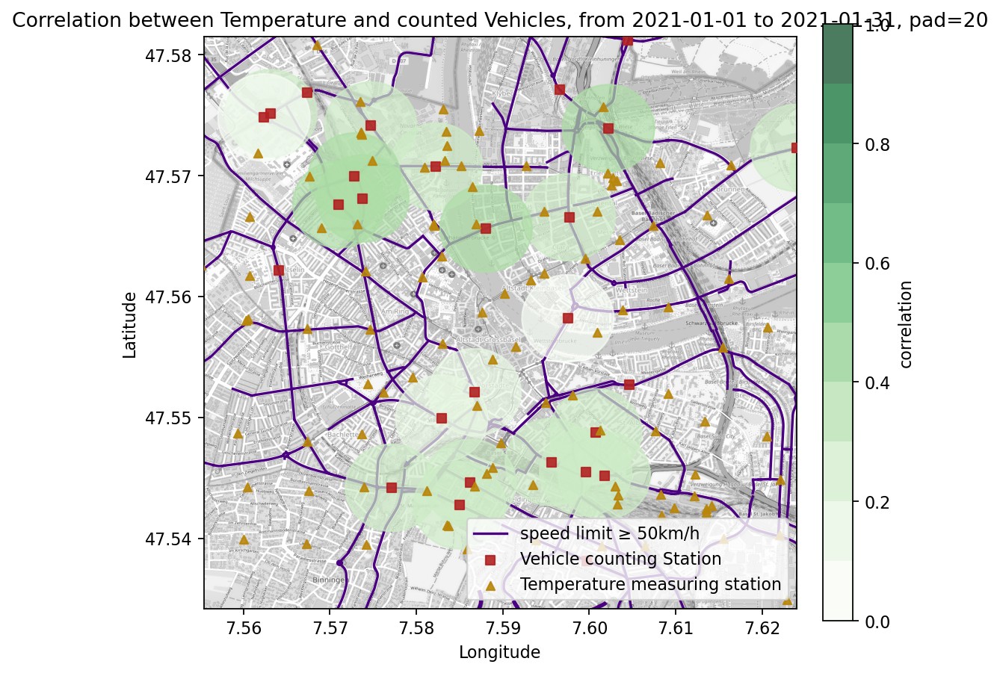

2021-02-28 00:00:00
2021-02-01 01:00:00
True
29
145


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[nan, 0.15922093093995762, nan, 0.09127090541645103, 0.11482663207082364, 0.3434017216412658, 0.26168170005736924, 0.15001062455998423, 0.1746071477153128, 0.3320328180007298, nan, 0.21572275456867657, 0.2264382432092789, 0.17461752064676447, 0.06566184941196326, -0.03671744175757276, 0.15242003733692938, nan, 0.27528582223361664, 0.3871234123621686, 0.33624091747137647, 0.2830073432328478, 0.20885212830378072, 0.2742220724916131, 0.4265222960127425, 0.28529387117552196, 0.33551649148402274, 0.22015771086804808, nan]
TIME NEEDED:  87.08523321151733
7 correlations calculated, now plotting...


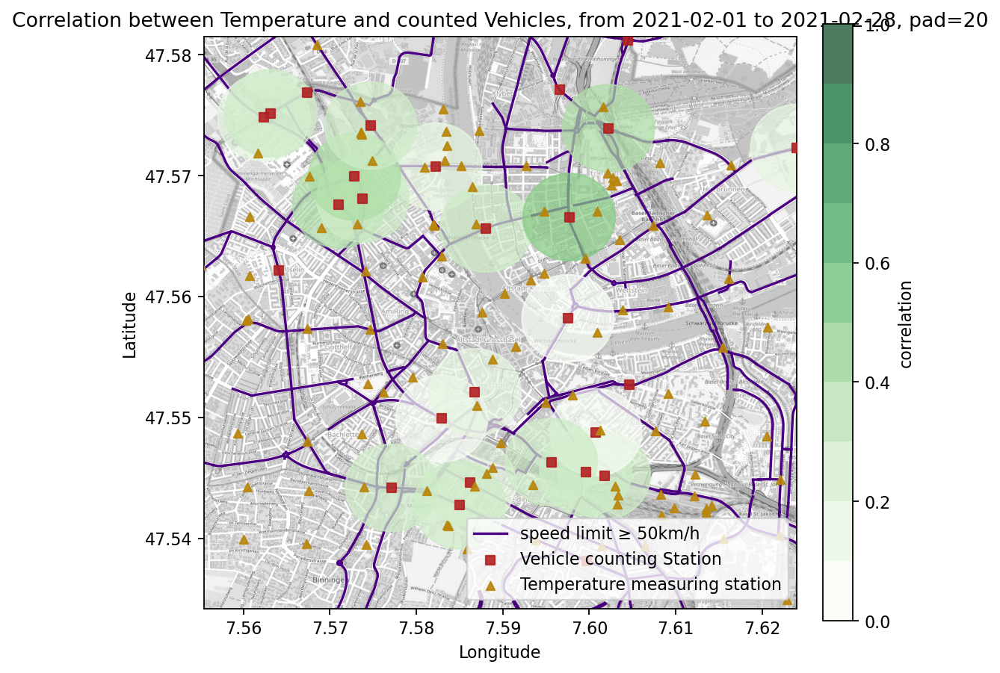

2021-03-31 00:00:00
2021-03-01 01:00:00
True
29
154


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[0.41128629545313083, 0.3462984009556444, 0.2630680392504864, 0.2802364692508843, 0.36175639255516534, 0.23604411444797266, 0.06510389644253098, 0.3253861640311133, 0.408902473525403, 0.4828907441046361, nan, 0.3219154184561828, 0.2868158623533701, 0.23117008826513513, -0.01307658919359432, 0.34329652127904897, 0.29496194728959907, 0.2388695941574327, nan, 0.33176188801915696, nan, 0.033733933594511975, 0.32377570167861847, 0.3914411399156808, nan, 0.09635596609901184, 0.34388645967864284, nan, 0.31660340930405]
TIME NEEDED:  103.92825245857239
8 correlations calculated, now plotting...


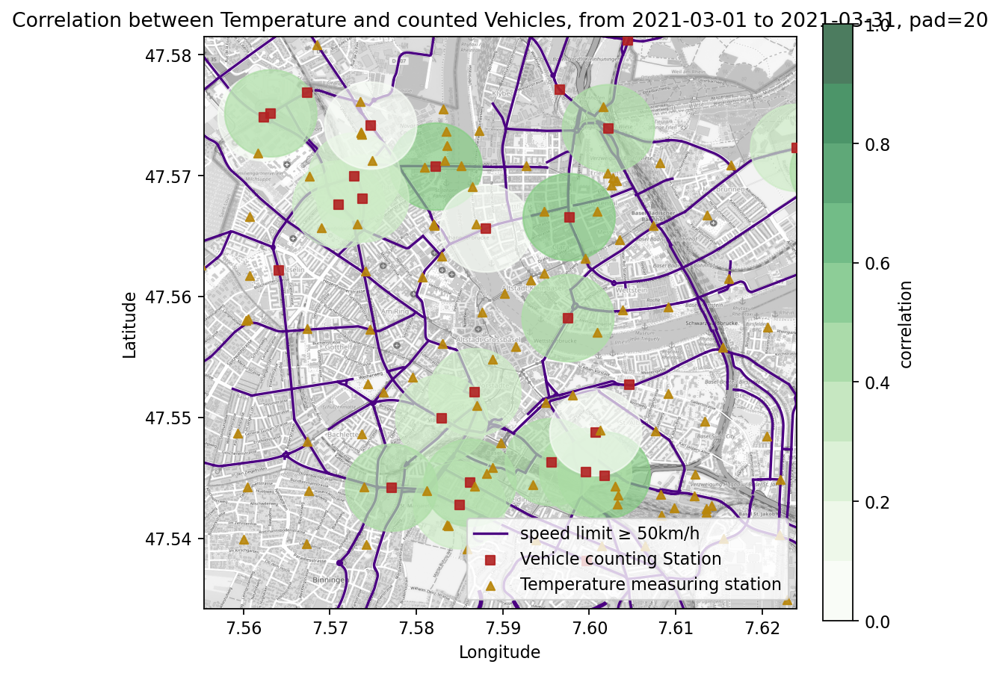

2021-04-30 00:00:00
2021-04-01 01:00:00
True
29
160


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[0.20990597846485687, 0.1792039887826043, 0.06959324641268541, 0.16029756383341973, 0.22083651778123972, 0.02015210984915768, nan, 0.3658345820913922, nan, nan, 0.02519208535109637, 0.20495422442475864, 0.3611852788229933, 0.3920735450255033, 0.1890269993116099, 0.29921060176671704, 0.15402562565799247, nan, -0.07894529494211419, 0.13228315649496772, 0.2333173180461434, 0.10435563110049952, 0.05883466908303194, 0.23071725588478337, 0.18926270517784485, nan, 0.21435724698971564, 0.17416907571215468, 0.2843733236548995]
TIME NEEDED:  99.55833554267883
9 correlations calculated, now plotting...


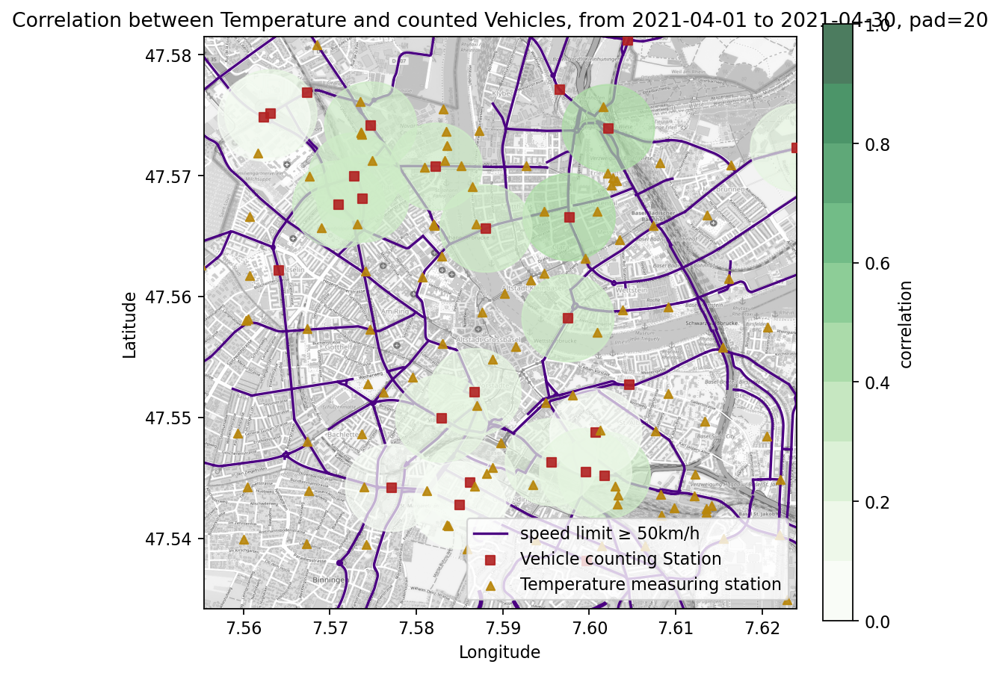

2021-05-31 00:00:00
2021-05-01 01:00:00
True
29
158


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[0.37215959313251423, -0.012284119039051711, 0.21407128436742376, -0.09555876584983125, 0.09063300861365325, nan, 0.11351882255963212, 0.1551045582756921, 0.029735266234336154, 0.06290237329157018, 0.1654839158210942, -0.010868713782733455, 0.21902662786245006, nan, 0.23353296643563318, 0.09828974200782986, 0.020194557257576424, 0.07809703468883959, 0.034712175155217684, -0.004381362007244007, 0.22056293841613864, nan, nan, 0.17204722723060514, 0.08663199794555342, -0.10401063908058682, nan, 0.07824215511534764, 0.2000632078650288]
TIME NEEDED:  101.67789816856384
10 correlations calculated, now plotting...


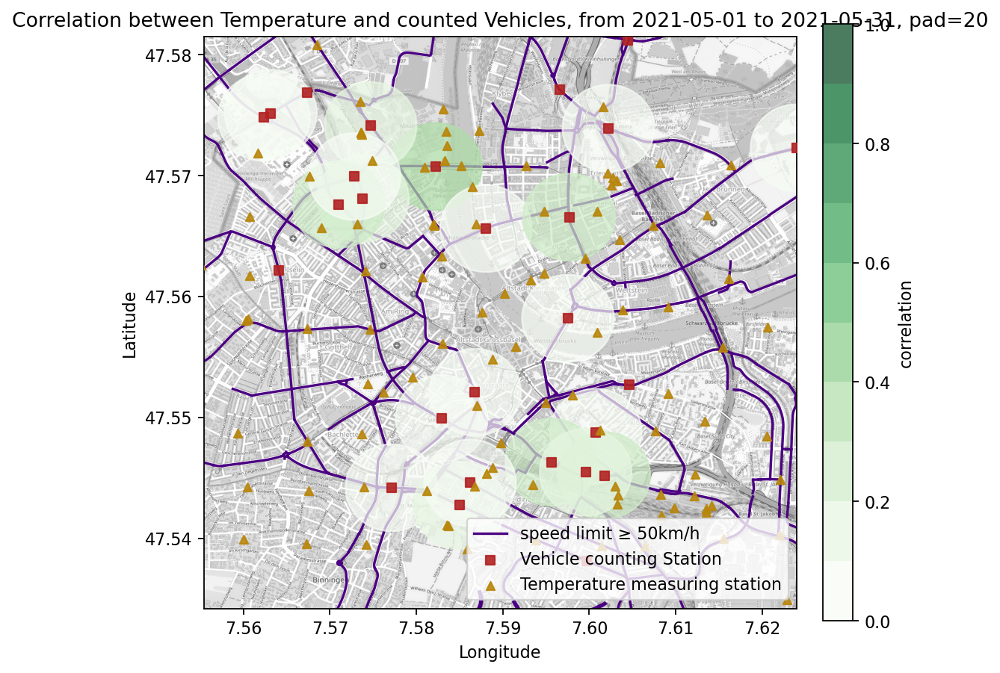

2021-06-30 00:00:00
2021-06-01 01:00:00
True
29
163


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[0.0038920008473887885, 0.0902063478256436, 0.26182452502970555, 0.1920941047490287, 0.19164892808398518, nan, nan, 0.11042973096546624, nan, -0.22338211488328166, 0.18015478635951676, nan, 0.04759995140617625, -0.3473032681559847, 0.08072670835273632, -0.1780046826245446, -0.016766326856148872, nan, nan, nan, 0.1995108247552736, 0.10681401523139407, 0.16829599276622736, nan, 0.06026013197785486, nan, 0.006141617412321953, 0.36016625452757134, 0.1606196185516565]
TIME NEEDED:  92.28242206573486
11 correlations calculated, now plotting...


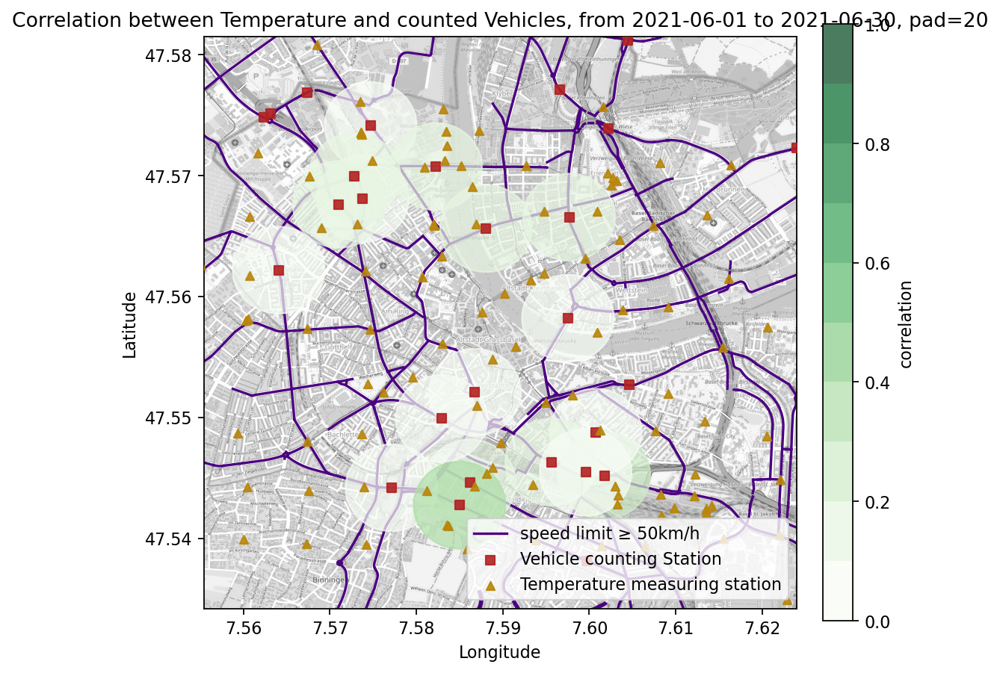

2021-07-31 00:00:00
2021-07-01 01:00:00
True
29
153


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1
DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9
DONE: 10


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[-0.15411723820315226, 0.21920067334963908, 0.05705457172970829, 0.2429571496201945, 0.0837215241744839, 0.24021310869919799, 0.1300011965846038, 0.14403615483591686, 0.2634416254930573, nan, -0.021950913391092813, nan, 0.004574445512986626, 0.17189500340687186, 0.02960651108423626, 0.001874464564448111, nan, nan, -0.00557356171397708, nan, -0.02008729013714562, nan, -0.01637746730460277, nan, nan, nan, 0.1647699990700589, -0.02070255501399253, 0.09237866994246384]
TIME NEEDED:  108.59392499923706
12 correlations calculated, now plotting...


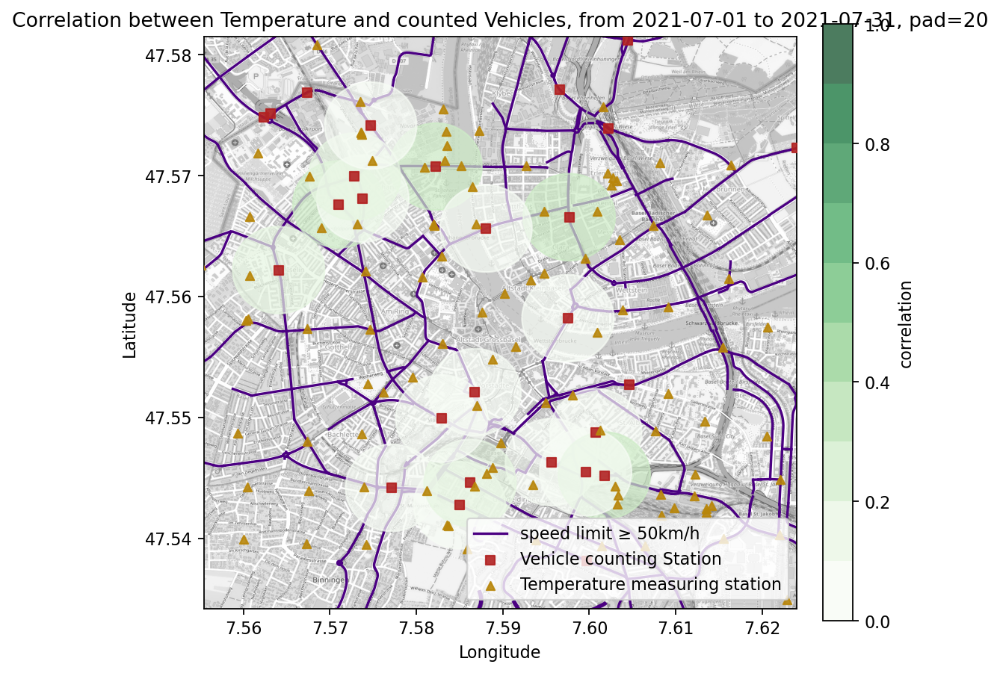

2021-08-31 00:00:00
2021-08-01 01:00:00
True
29
143


C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:52: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_here["Datum"] = pd.to_datetime(temp_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")
C:\Users\phweb\AppData\Local\Temp/ipykernel_3368/1430007533.py:53: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  veh_here["Datum"] = pd.to_datetime(veh_here["Datum"], format="%Y-%m-%d").dt.strftime("%Y-%m-%d")


DONE: 1


C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2559: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
C:\Users\phweb\miniconda3\envs\pr\lib\site-packages\numpy\lib\function_base.py:2560: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


DONE: 2
DONE: 3
DONE: 4
DONE: 5
DONE: 6
DONE: 7
DONE: 8
DONE: 9
DONE: 10
DONE: 11
DONE: 12
DONE: 13
DONE: 14
DONE: 15
DONE: 16
DONE: 17
DONE: 18
DONE: 19
DONE: 20
DONE: 21
DONE: 22
DONE: 23
DONE: 24
DONE: 25
DONE: 26
DONE: 27
DONE: 28
DONE: 29
[nan, 0.25451180069629414, 0.07172684649154837, 0.028909266620550628, 0.14221801532491854, -0.04003146885546116, 0.03087579621350336, 0.12434905165429487, 0.08842493210157618, 0.29790606333494013, 0.1747046133674703, nan, nan, 0.09391163534446575, 0.13608234980207295, 0.136992568962338, nan, 0.22568213247837307, nan, nan, 0.038380612413891374, 0.07903964145806573, 0.0991406572367082, nan, 0.057560163800458725, 0.15429687700326997, nan, nan, -0.2848433682940941]
TIME NEEDED:  93.09703159332275
13 correlations calculated, now plotting...


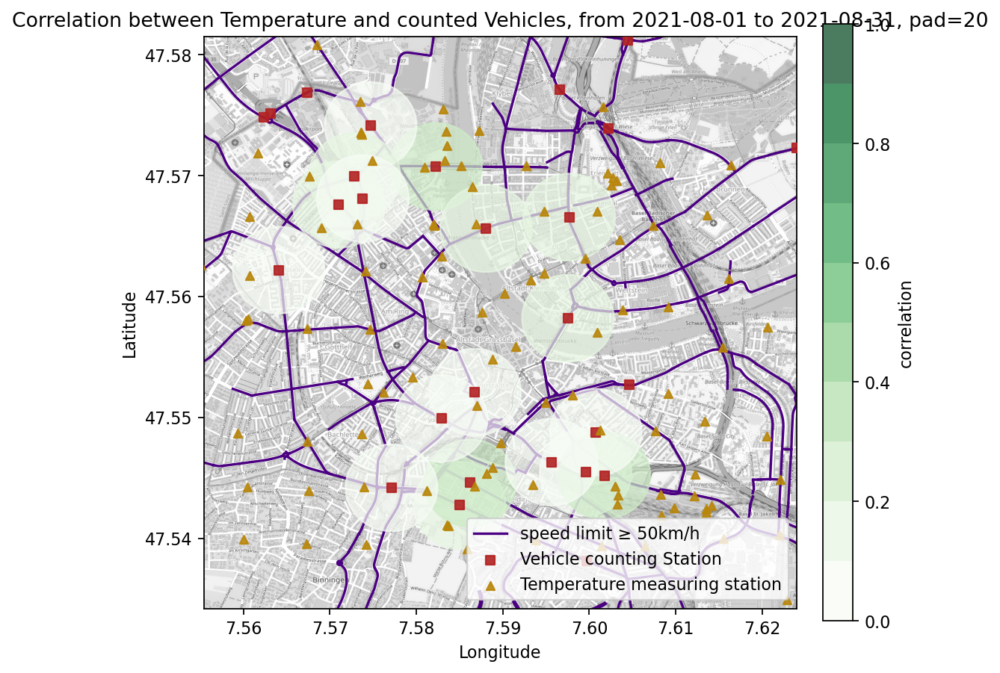

In [113]:
date = dt.datetime(2020,8,1)
temperature_set = pd.read_csv("datasets/luftklima_reformatted.csv")
vehicles_set = pd.read_csv("datasets/verkehrszählungen_reformatted.csv")

for i in range(0, 13):
    date_start = date + relativedelta(months=+i)
    date_start = date_start.strftime("%Y-%m-%d")
    date_end = date + relativedelta(months=+(i+1)) - dt.timedelta(days=1)
    date_end = date_end.strftime("%Y-%m-%d")
    corr = get_temp_for_vstation(temperature_set, vehicles_set, 0.4, date_start, date_end, "1", "1", 6, True)
    print(str(i+1) + " correlations calculated, now plotting...")
    el = calc_ellipse_dists(corr[0], corr[1], 0.4)
    plot_corr(corr, el, i, date_start, date_end)
    

In [36]:
def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(math.radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1
    dlat = lat2 - lat1 
    a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
    c = 2 * math.asin(math.sqrt(a)) 
    # Radius of earth in kilometers is 6371
    km = 6371*c
    return km

In [67]:
start = time.time()
for i in range(10000):
    haversine(7.59525,47.5535,7.59775,47.5565)
    #Wettsteinbrücke ca 370m here: 383m
print(time.time() - start)

start = time.time()
for i in range(10000):
    distance.distance((47.5535, 7.59525),(47.5565, 7.59775)).km
    #Wettsteinbrücke ca 370m here: 383m
print(time.time() - start)

print(haversine(7.59525,47.5535,7.59775,47.5565))
print(distance.distance((47.5535, 7.59525),(47.5565, 7.59775)).km)

0.018955469131469727
1.5738928318023682
0.38272159925913946
0.38295852972924904


In [77]:
p = geopy.distance.distance(kilometers=0.4).destination((47.56, 7.58), bearing=90)

In [82]:
p[0]

47.559999876851215

In [76]:
geopy.distance.distance(kilometers=0.4).destination((47.56, 7.58), bearing=0)

Point(47.56359771137424, 7.58, 0.0)

In [75]:
print(distance.distance((47.56, 7.58),(47.559999876851215, 7.585315071734571)).km)

0.39999999999996794


In [40]:
corr[0]

[7.62857136599,
 7.58292410405,
 7.60221558365,
 7.60074551669,
 7.58226721123,
 7.58499570186,
 7.64377560544,
 7.56734174237,
 7.56235975514,
 7.63010594485,
 7.59767325247,
 7.58805266441,
 7.5956105688,
 7.65559694893,
 7.6017439017,
 7.59957932935,
 7.56315796773,
 7.5931162086,
 7.59753472493,
 7.60450160902,
 7.58677034361,
 7.57380422434,
 7.57101717908,
 7.58621009181,
 7.57471395015,
 7.57284015165,
 7.60459281521,
 7.57712039374,
 7.56405911184]

In [4]:
a = dt.datetime(2021,2,2)
a = dt.datetime.strptime(a, "%Y-%m-%d")

TypeError: strptime() argument 1 must be str, not datetime.datetime

In [3]:
a < "2022-04-04"

TypeError: '<' not supported between instances of 'datetime.datetime' and 'str'